In [ ]:
# Import the Rquired Libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import explained_variance_score
from time import time
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree  import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score, median_absolute_error


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 1.5 MB/s eta 0:00:00


In [ ]:
# Read the CSV file into a DataFrame
df1 = pd.read_csv('realtor.csv')

# Display the first few rows of the DataFrame
df1.head()


,status,bed,bath,acre_lot,city,state,zip_code,house_size,prev_sold_date,price
0,for_sale,3.0,2.0,0.12,Adjuntas,Puerto Rico,601.0,920.0,NaN,105000.0
1,for_sale,4.0,2.0,0.08,Adjuntas,Puerto Rico,601.0,1527.0,NaN,80000.0
2,for_sale,2.0,1.0,0.15,Juana Diaz,Puerto Rico,795.0,748.0,NaN,67000.0
3,for_sale,4.0,2.0,0.10,Ponce,Puerto Rico,731.0,1800.0,NaN,145000.0
4,for_sale,6.0,2.0,0.05,Mayaguez,Puerto Rico,680.0,NaN,NaN,65000.0


In [ ]:
df1.columns

Index(['status', 'bed', 'bath', 'acre_lot', 'city', 'state', 'zip_code',
       'house_size', 'prev_sold_date', 'price'],
      dtype='object')

In [ ]:
df2 = df1.drop(['status','prev_sold_date','acre_lot','state','city'],axis='columns')

In [ ]:
df2.shape

(1401066, 5)

In [ ]:
df2['zip_code'] = df2['zip_code'].astype(str)

In [ ]:
df2.isnull().sum()

bed           216528
bath          194213
zip_code           0
house_size    450112
price            108
dtype: int64

In [ ]:
df3 = df2.dropna()
df3.isnull().sum()

bed           0
bath          0
zip_code      0
house_size    0
price         0
dtype: int64

In [ ]:
df4 = df3.copy()
df4['price_per_sqft'] = df4['price']/df4['house_size']
df4.head()

,bed,bath,zip_code,house_size,price,price_per_sqft
0,3.0,2.0,601.0,920.0,105000.0,114.130435
1,4.0,2.0,601.0,1527.0,80000.0,52.390308
2,2.0,1.0,795.0,748.0,67000.0,89.572193
3,4.0,2.0,731.0,1800.0,145000.0,80.555556
5,4.0,3.0,612.0,2520.0,179000.0,71.031746


In [ ]:
df_stats = df4['price_per_sqft'].describe()
df_stats

count    911118.000000
mean        418.046560
std        1626.643691
min           0.000344
25%         163.545455
50%         258.041958
75%         441.860465
max      462500.000000
Name: price_per_sqft, dtype: float64

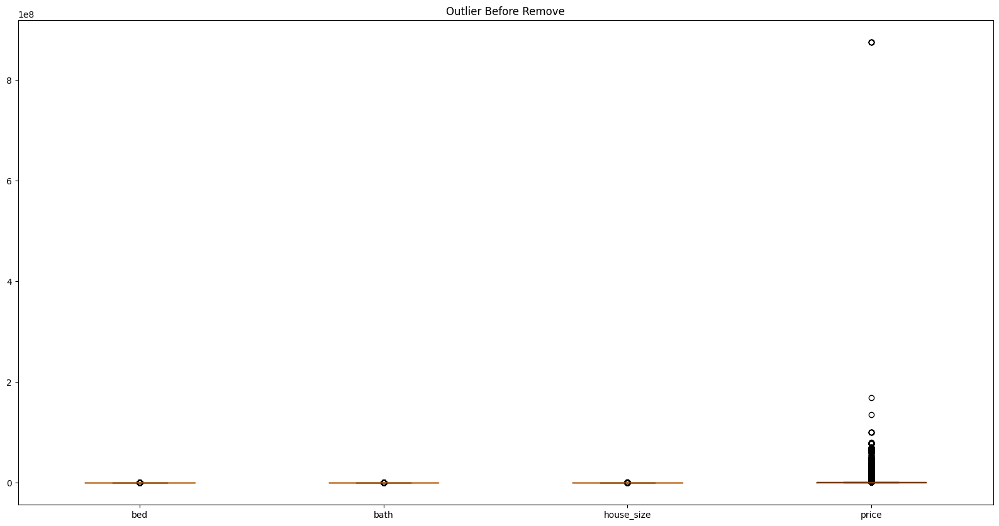

Total Row With Outlier: 911118


In [ ]:
column_num = ['bed','bath','house_size','price']
plt.boxplot(df4[column_num])
plt.xticks([1, 2, 3, 4], column_num)
plt.title('Outlier Before Remove')
plt.show()
print(f'Total Row With Outlier: {df4.shape[0]}')

In [ ]:
Q1 = df4[column_num].quantile(0.25)
Q3 = df4[column_num].quantile(0.75)
IQR = Q3 - Q1
df4 = df4[~((df4[column_num] < (Q1 - 1.5 * IQR)) | (df4[column_num] > (Q3 + 1.5 * IQR))).any(axis=1)]

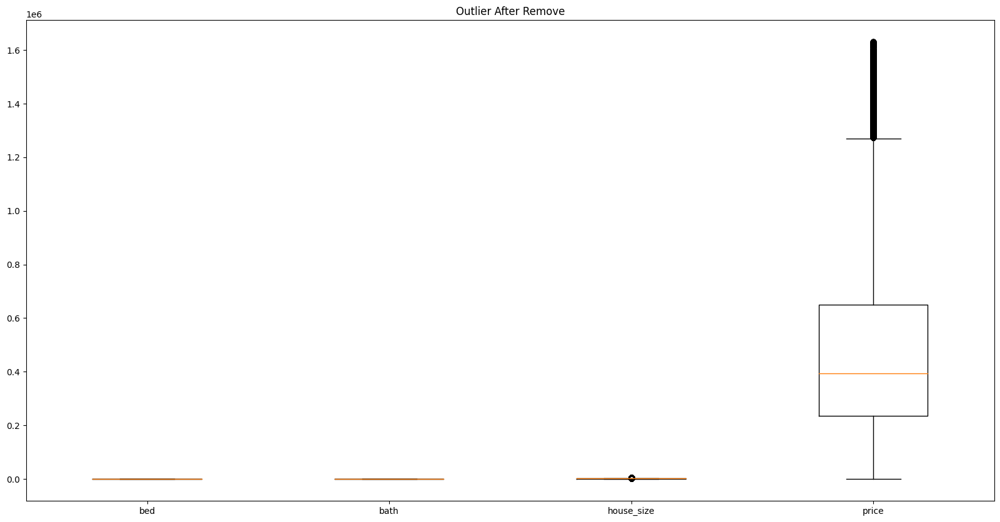

Total Row Without Outlier: 768752


In [ ]:
column_num = ['bed','bath','house_size','price']
plt.boxplot(df4[column_num])
plt.xticks([1, 2, 3, 4], column_num)
plt.title('Outlier After Remove')
plt.show()
print(f'Total Row Without Outlier: {df4.shape[0]}')

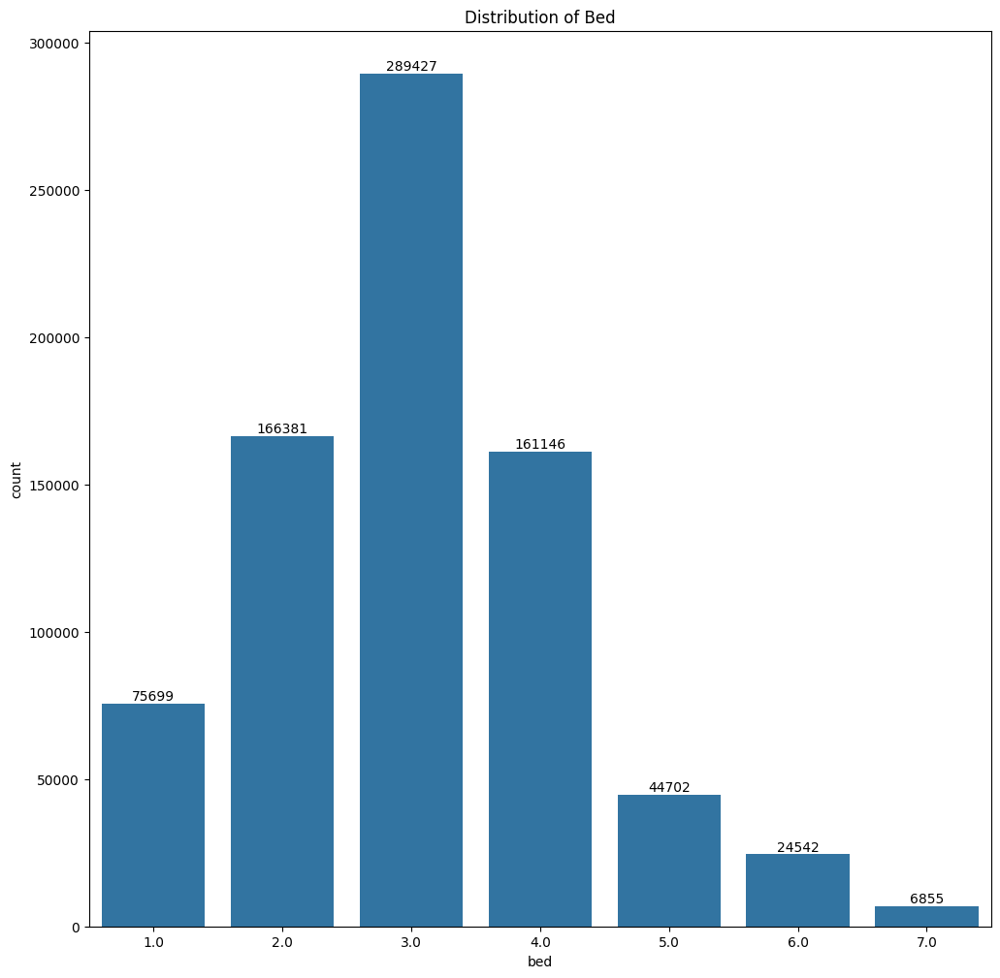

In [ ]:
plt.figure(figsize=(12,12))
ax = sns.countplot(data=df4, x='bed')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bed', fontsize=12)
plt.show()

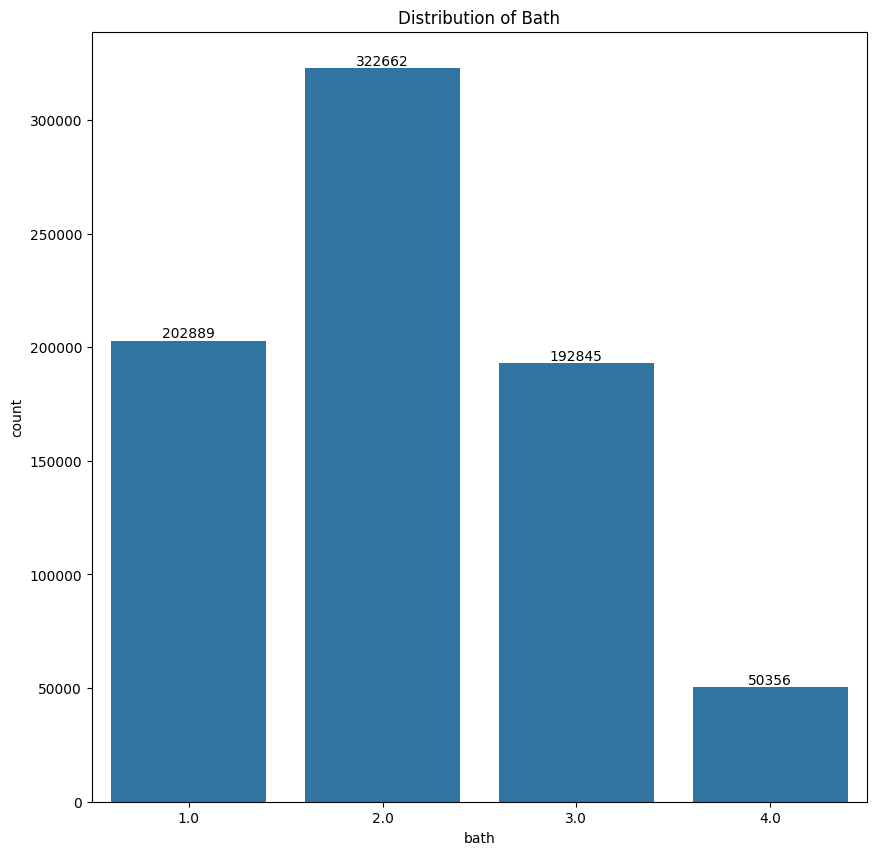

In [ ]:
plt.figure(figsize=(10,10))
ax = sns.countplot(data=df4, x='bath')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bath', fontsize=12)
plt.show()

In [ ]:
df4.groupby('bed', as_index=False).agg({'bath' : 'mean'}).sort_values('bath', ascending=False)

,bed,bath
6,7.0,3.127498
4,5.0,2.858284
5,6.0,2.817334
3,4.0,2.624018
2,3.0,2.127942
1,2.0,1.722667
0,1.0,1.115814


In [ ]:
location_stats = df4['zip_code'].value_counts(ascending=False)
location_stats

zip_code
12180.0    3732
12401.0    3650
10463.0    2947
2127.0     2600
11375.0    2451
           ... 
7075.0       11
12741.0      11
14101.0      11
13777.0      11
7946.0       11
Name: count, Length: 3625, dtype: int64

In [ ]:
location_stats.values.sum()

768752

In [ ]:
len(location_stats[location_stats>10])

3625

In [ ]:
len(location_stats)

3625

In [ ]:
len(location_stats[location_stats<=10])

0

In [ ]:
location_stats_less_than_10 = location_stats[location_stats<=10]
location_stats_less_than_10

Series([], Name: count, dtype: int64)

In [ ]:
len(df4.zip_code.unique())

3625

In [ ]:
df4.zip_code = df4.zip_code.apply(lambda x: 'other' if x in location_stats_less_than_10 else x)
len(df4.zip_code.unique())

3625

In [ ]:
df4[df4.house_size/df4.bed<700].head()

,bed,bath,zip_code,house_size,price,price_per_sqft
0,3.0,2.0,601.0,920.0,105000.0,114.130435
1,4.0,2.0,601.0,1527.0,80000.0,52.390308
2,2.0,1.0,795.0,748.0,67000.0,89.572193
3,4.0,2.0,731.0,1800.0,145000.0,80.555556
5,4.0,3.0,612.0,2520.0,179000.0,71.031746


In [ ]:
df6 = df4[~(df4.house_size/df4.bed<600)]
df6.shape

(312605, 6)

In [ ]:
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('zip_code'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df7 = remove_pps_outliers(df6)
df7.shape

(210114, 6)

In [ ]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('zip_code'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bed'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bed'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>9:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')
df8 = remove_bhk_outliers(df7)
# df8 = df7.copy()
df8.shape

(157819, 6)

Text(0, 0.5, 'Count')

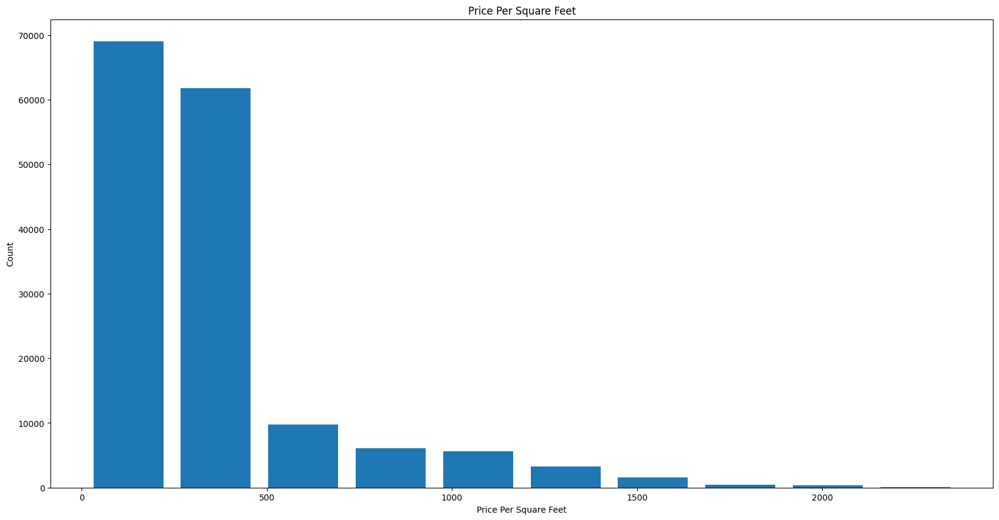

In [ ]:
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.title('Price Per Square Feet', fontsize=12)
plt.hist(df8.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

Text(0, 0.5, 'Count')

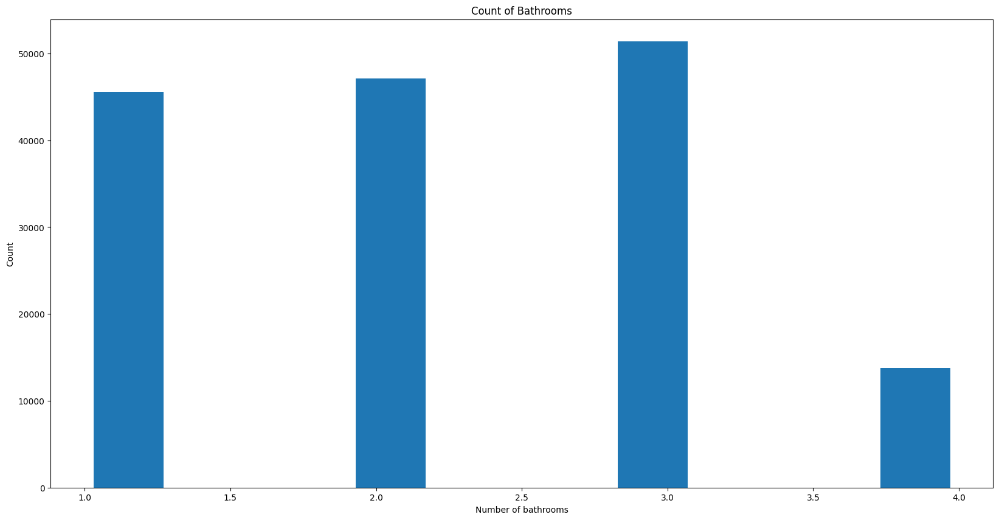

In [ ]:
plt.hist(df8.bath,rwidth=0.8)
plt.title('Count of Bathrooms', fontsize=12)
plt.xlabel("Number of bathrooms")
plt.ylabel("Count")

In [ ]:
df8[df8.bath>df8.bed+2]

,bed,bath,zip_code,house_size,price,price_per_sqft
112888,1.0,4.0,19145.0,2358.0,429900.0,182.315522
112907,1.0,4.0,19145.0,2358.0,429900.0,182.315522
112918,1.0,4.0,19145.0,2358.0,429900.0,182.315522
166441,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166447,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166454,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166460,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166466,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166472,1.0,4.0,6076.0,2820.0,425000.0,150.709220
166479,1.0,4.0,6076.0,2820.0,425000.0,150.709220


In [ ]:
df8[df8.bath>10]

,bed,bath,zip_code,house_size,price,price_per_sqft


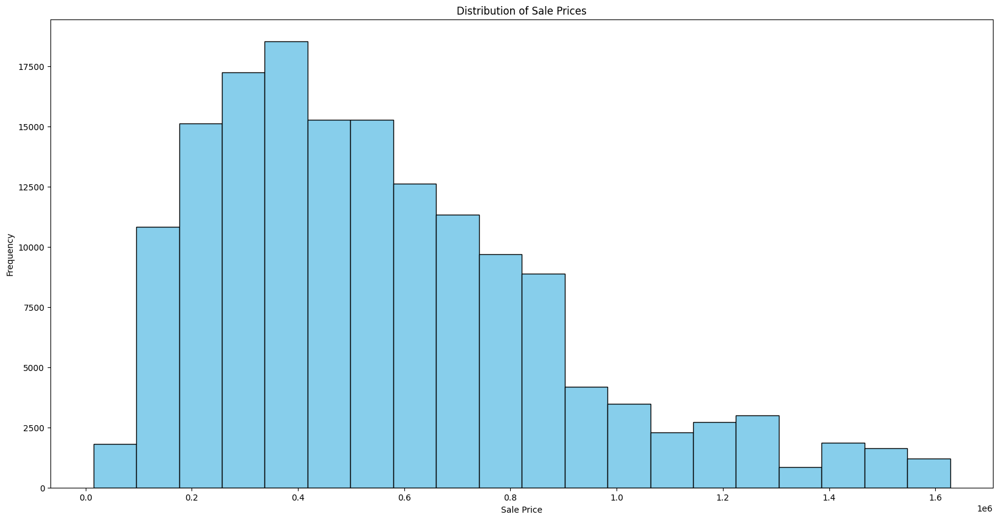

In [ ]:
plt.hist(df8['price'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Sale Price')
plt.ylabel('Frequency')
plt.title('Distribution of Sale Prices')
plt.show()

In [ ]:
fig = px.scatter(df8, x='house_size', y='price', color='house_size', hover_data=['bed', 'bath'])
fig.update_layout(title='Interactive Scatter Plot of Square Footage vs. Sale Price')
fig.show()

In [ ]:
fig = px.scatter_3d(df8, x='house_size', y='bed', z='price', color='house_size', size_max=10)
fig.update_layout(title='3D Scatter Plot of Square Footage, Bedrooms, and Sale Price')
fig.show()

<ipython-input-56-5e4f49d69993>:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




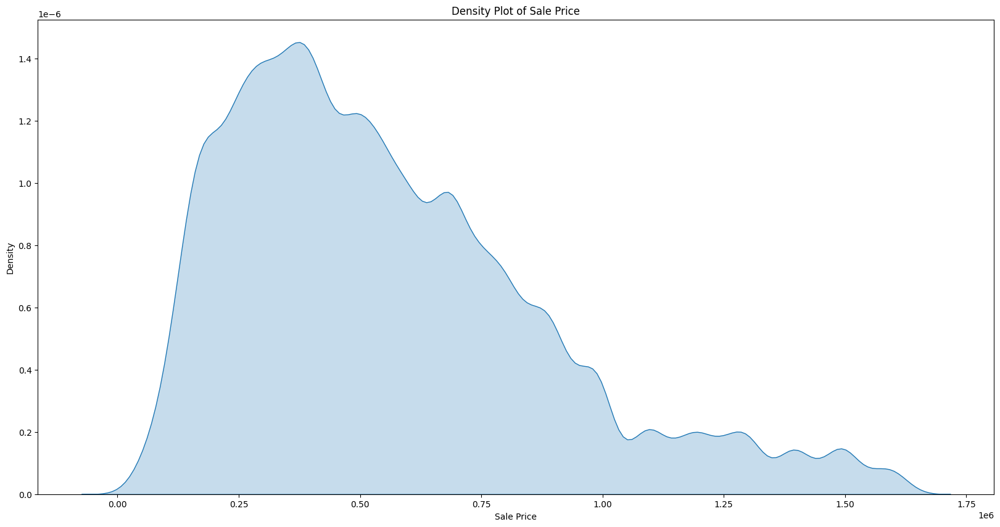

In [ ]:
sns.kdeplot(df8['price'], shade=True)
plt.xlabel('Sale Price')
plt.ylabel('Density')
plt.title('Density Plot of Sale Price')
plt.show()

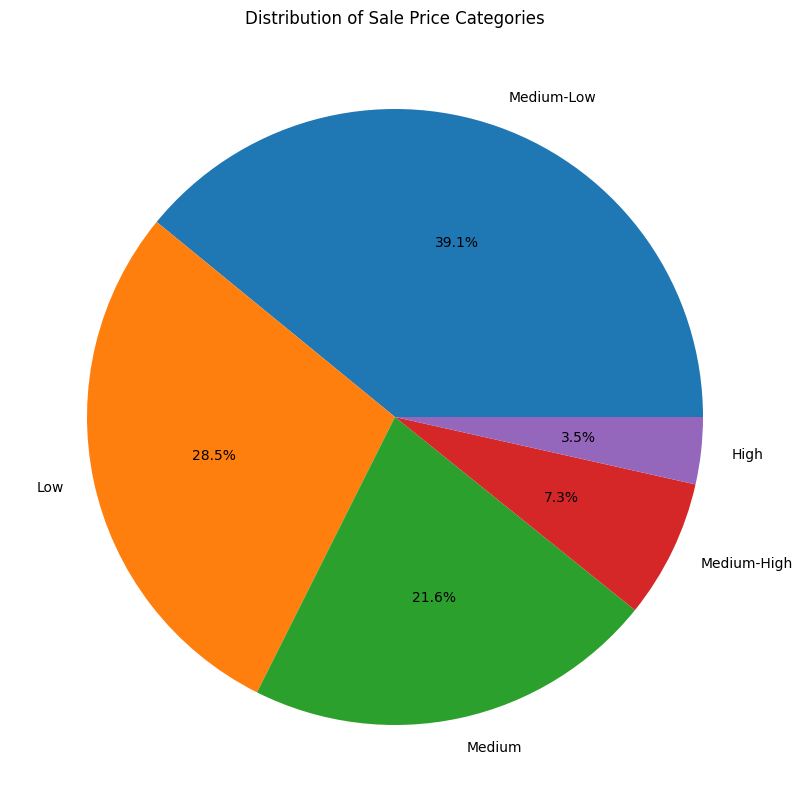

In [ ]:
sale_price_bins = pd.cut(df8['price'], bins=5, labels=['Low', 'Medium-Low', 'Medium', 'Medium-High', 'High'])
sale_price_bins.value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Sale Price Categories')
plt.ylabel('')
plt.show()

In [ ]:
fig = go.Figure(data=go.Scatterpolar(
  r=[5, 3, 2, 5],
  theta=['house_size', 'bed', 'bath', 'price'],
  fill='toself'
))
fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True
    ),
  ),
  title='Radial Plot of Feature Importance'
)
fig.show()

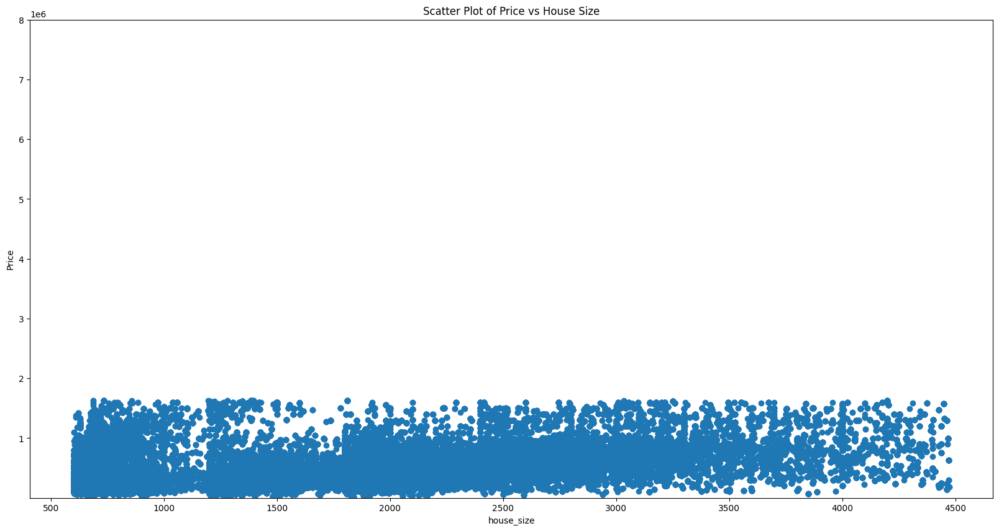

In [ ]:
var = 'house_size'
data = pd.concat([df8['price'], df8[var]], axis=1)
plt.scatter(data[var], data['price'])
plt.xlabel(var)
plt.ylabel('Price')
plt.title('Scatter Plot of Price vs House Size')
plt.ylim(3, 8000000)
plt.show()

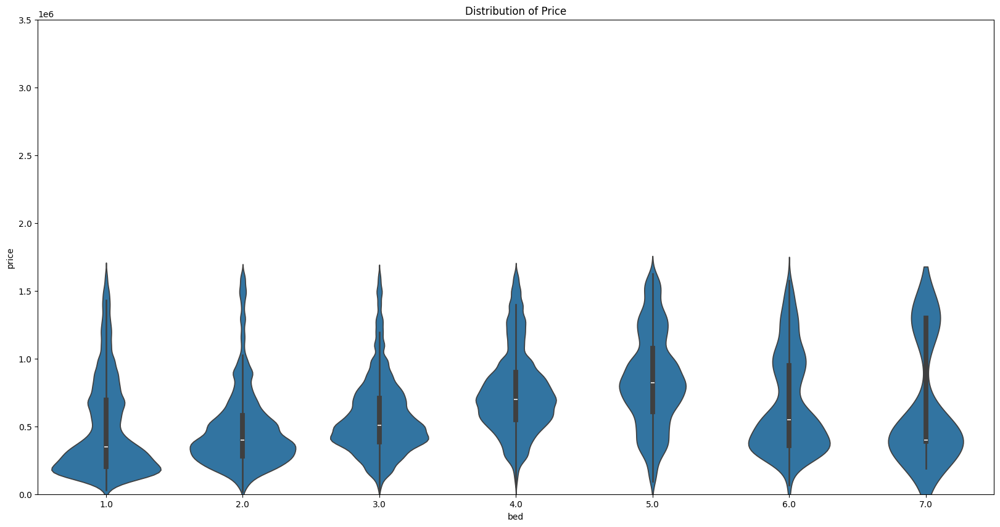

In [ ]:
var = 'bed'
data = pd.concat([df8['price'], df8[var]], axis=1)
plt.title('Distribution of Price', fontsize=12)
fig = sns.violinplot(x=var, y="price", data=data)
fig.axis(ymin=0, ymax=3500000);

In [ ]:
df9 = df8[df8.bath<df8.bed+2]

In [ ]:
df10 = df9.drop(['price_per_sqft'],axis='columns')
df10.head(3)

,bed,bath,zip_code,house_size,price
0,1.0,1.0,10001.0,980.0,1500000.0
1,1.0,1.0,10001.0,1036.0,1375000.0
2,1.0,1.0,10001.0,1036.0,1375000.0


In [ ]:
dummies = pd.get_dummies(df10.zip_code)
dummies = dummies.astype(int)
dummies.head(3)

,10001.0,10002.0,10003.0,10004.0,10005.0,10006.0,10007.0,10009.0,1001.0,10010.0,...,969.0,971.0,976.0,979.0,982.0,983.0,985.0,987.0,nan,other
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df11 = pd.concat([df10,dummies.drop('other',axis='columns')],axis='columns')
df11.head()

,bed,bath,zip_code,house_size,price,10001.0,10002.0,10003.0,10004.0,10005.0,...,966.0,969.0,971.0,976.0,979.0,982.0,983.0,985.0,987.0,nan
0,1.0,1.0,10001.0,980.0,1500000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1.0,1.0,10001.0,1036.0,1375000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1.0,1.0,10001.0,1036.0,1375000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1.0,2.0,10001.0,1240.0,1560000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1.0,1.0,10001.0,980.0,1500000.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df12 = df11.drop('zip_code',axis='columns')
df12.head(2)

,bed,bath,house_size,price,10001.0,10002.0,10003.0,10004.0,10005.0,10006.0,...,966.0,969.0,971.0,976.0,979.0,982.0,983.0,985.0,987.0,nan
0,1.0,1.0,980.0,1500000.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1.0,1.0,1036.0,1375000.0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X = df12.drop(['price'],axis='columns')

In [ ]:
X.shape

(157102, 2782)

In [ ]:
y = df12.price
len(y)

157102

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [ ]:
lr_clf = LinearRegression()
start = time()
lr_clf.fit(X_train,y_train)
end=time()
train_time_li=end-start
linear=lr_clf.score(X_test,y_test)
lipredictions = lr_clf.predict(X_test)
exp_li = explained_variance_score(lipredictions,y_test)
# Regression metrics
linear = lr_clf.score(X_test, y_test)
mae_li = mean_absolute_error(y_test, lipredictions)
mse_li = mean_squared_error(y_test, lipredictions)
rmse_li = np.sqrt(mse_li)
medae_li = median_absolute_error(y_test, lipredictions)

# Additional evaluation metrics
# Mean Percentage Error (MPE)
mpe_li = np.mean((y_test - lipredictions) / y_test) * 100

# Mean Absolute Percentage Error (MAPE)
mape_li = np.mean(np.abs((y_test - lipredictions) / y_test)) * 100

# Mean Bias Error (MBE)
mbe_li = np.mean(y_test - lipredictions)

# Print regression metrics
print("Linear Regression Metrics:")
print("Coefficient of Determination (R^2):", linear)
print("Mean Absolute Error (MAE):", mae_li)
print("Mean Squared Error (MSE):", mse_li)
print("Root Mean Squared Error (RMSE):", rmse_li)
print("Explained Variance Score:", exp_li)
print("Median Absolute Error (MedAE):", medae_li)

# Print additional evaluation metrics
print("Mean Percentage Error (MPE):", mpe_li)
print("Mean Absolute Percentage Error (MAPE):", mape_li)
print("Mean Bias Error (MBE):", mbe_li)

Linear Regression Metrics:
Coefficient of Determination (R^2): 0.8940516071941674
Mean Absolute Error (MAE): 70239.67015820138
Mean Squared Error (MSE): 11416475778.135576
Root Mean Squared Error (RMSE): 106847.90956371387
Explained Variance Score: 0.8821726322563602
Median Absolute Error (MedAE): 43823.06187050382
Mean Percentage Error (MPE): -0.5196108210109731
Mean Absolute Percentage Error (MAPE): 17.11599311334639
Mean Bias Error (MBE): 459.3695098444743


In [ ]:
y_mean = np.mean(y_train)
xgb_params = {
    'eta': 0.037,
    'max_depth': 5,
    'subsample': 0.80,
    'objective': 'reg:linear',
    'eval_metric': 'mae',
    'lambda': 0.8,
    'alpha': 0.4,
    'base_score': y_mean,
    'silent': 1
}

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test)

num_boost_rounds = 250

In [ ]:
model = xgb.train(dict(xgb_params, silent=1), dtrain, num_boost_round=num_boost_rounds)

print( "\nPredicting with XGBoost")
xgb_pred1 = model.predict(dtest)

print( "\nFirst XGBoost predictions:" )
print( pd.DataFrame(xgb_pred1).head() )

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[21:20:47] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[21:20:47] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.





Predicting with XGBoost

First XGBoost predictions:
              0
0  827015.56250
1  553098.87500
2  496680.96875
3  409439.62500
4  450268.00000


In [ ]:
xgb_params = {
    'eta': 0.033,
    'max_depth': 6,
    'subsample': 0.80,
    'objective': 'reg:linear',
    'eval_metric': 'mae',
    'base_score': y_mean,
    'silent': 1
}

num_boost_rounds = 150

In [ ]:
print( "\nTraining XGBoost")
model = xgb.train(dict(xgb_params, silent=1), dtrain, num_boost_round=num_boost_rounds)

xgb_pred2 = model.predict(dtest)

print( "\nSecond XGBoost predictions:" )
print( pd.DataFrame(xgb_pred2).head() )


Training XGBoost


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[21:20:59] WARNING: /workspace/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[21:20:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "silent" } are not used.





Second XGBoost predictions:
             0
0  817752.7500
1  553721.5000
2  496873.1250
3  408580.3750
4  461205.8125


In [ ]:
start = time()
est=GradientBoostingRegressor(n_estimators=50, max_depth=5, loss='squared_error',min_samples_split=2,learning_rate=0.1).fit(X_train, y_train)
end=time()
train_time_g=end-start
gradient=est.score(X_test,y_test)

pred = est.predict(X_test)
exp_est = explained_variance_score(pred,y_test)
mae_est = mean_absolute_error(y_test, pred)
mse_est = mean_squared_error(y_test, pred)
rmse_est = np.sqrt(mse_est)

# Print evaluation metrics
print("Gradient Boosting Regression Metrics:")
print("Coefficient of Determination (R^2):", gradient)
print("Explained Variance Score:", exp_est)
print("Mean Absolute Error (MAE):", mae_est)
print("Mean Squared Error (MSE):", mse_est)
print("Root Mean Squared Error (RMSE):", rmse_est)

Gradient Boosting Regression Metrics:
Coefficient of Determination (R^2): 0.41375665428272823
Explained Variance Score: -1.874213369848182
Mean Absolute Error (MAE): 200720.92554891016
Mean Squared Error (MSE): 63170688853.58257
Root Mean Squared Error (RMSE): 251337.79829858974


In [ ]:
start = time()
ada=AdaBoostRegressor(n_estimators=50, learning_rate=0.2,loss='exponential').fit(X_train, y_train)
end=time()
train_time_ada=end-start
pred=ada.predict(X_test)
adab=ada.score(X_test,y_test)
predict = ada.predict(X_test)
exp_ada = explained_variance_score(predict,y_test)
mae_ada = mean_absolute_error(y_test, pred)
mse_ada = mean_squared_error(y_test, pred)
rmse_ada = np.sqrt(mse_ada)

# Print evaluation metrics
print("AdaBoost Regression Metrics:")
print("Coefficient of Determination (R^2):", adab)
print("Explained Variance Score:", exp_ada)
print("Mean Absolute Error (MAE):", mae_ada)
print("Mean Squared Error (MSE):", mse_ada)
print("Root Mean Squared Error (RMSE):", rmse_ada)

AdaBoost Regression Metrics:
Coefficient of Determination (R^2): 0.12053351119759059
Explained Variance Score: -6.288452573089278
Mean Absolute Error (MAE): 255199.9242883727
Mean Squared Error (MSE): 94766967211.05823
Root Mean Squared Error (RMSE): 307842.4389376134


In [ ]:
decision=DecisionTreeRegressor()
start = time()
decision.fit(X_train, y_train)
end=time()
train_time_dec=end-start
decc=decision.score(X_test,y_test)
decpredict = decision.predict(X_test)
exp_dec = explained_variance_score(decpredict,y_test)

# Regression metrics
decc = decision.score(X_test, y_test)
mae_dec = mean_absolute_error(y_test, decpredict)
mse_dec = mean_squared_error(y_test, decpredict)
rmse_dec = np.sqrt(mse_dec)


# Print regression metrics
print("Decision Tree Metrics:")
print("Coefficient of Determination (R^2):", decc)
print("Mean Absolute Error (MAE):", mae_dec)
print("Mean Squared Error (MSE):", mse_dec)
print("Root Mean Squared Error (RMSE):", rmse_dec)
print("Explained Variance Score:", exp_dec)


Decision Tree Metrics:
Coefficient of Determination (R^2): 0.9893947036556637
Mean Absolute Error (MAE): 5819.793154509035
Mean Squared Error (MSE): 1142774379.3806655
Root Mean Squared Error (RMSE): 33804.946078653426
Explained Variance Score: 0.9893167841314892


In [ ]:
rand_regr = RandomForestRegressor(n_estimators=50,random_state=0)
start = time()
rand_regr.fit(X_train, y_train)
end=time()
train_time_rand=end-start
random=rand_regr.score(X_test,y_test)
predictions = rand_regr.predict(X_test)
exp_rand = explained_variance_score(predictions,y_test)
mae_rand = mean_absolute_error(y_test, predictions)
mse_rand = mean_squared_error(y_test, predictions)
rmse_rand = np.sqrt(mse_rand)
medae_rand = median_absolute_error(y_test, predictions)

# Additional evaluation metrics
# Mean Percentage Error (MPE)
mpe_rand = np.mean((y_test - predictions) / y_test) * 100

# Mean Absolute Percentage Error (MAPE)
mape_rand = np.mean(np.abs((y_test - predictions) / y_test)) * 100

# Mean Bias Error (MBE)
mbe_rand = np.mean(y_test - predictions)

# Print evaluation metrics
print("Random Forest Regression Metrics:")
print("Coefficient of Determination (R^2):", random)
print("Explained Variance Score:", exp_rand)
print("Mean Absolute Error (MAE):", mae_rand)
print("Mean Squared Error (MSE):", mse_rand)
print("Root Mean Squared Error (RMSE):", rmse_rand)


Random Forest Regression Metrics:
Coefficient of Determination (R^2): 0.9894095635703692
Explained Variance Score: 0.9892232933004865
Mean Absolute Error (MAE): 7708.069021571815
Mean Squared Error (MSE): 1141173148.3302684
Root Mean Squared Error (RMSE): 33781.25439249213


In [ ]:
def predict_price(bath, bed, house_size, zip_code):
    loc_index = np.where(X.columns == str(zip_code))[0]
    if len(loc_index) > 0:
        loc_index = loc_index[0]
    else:
        # Handle case where zip_code is not found
        print("Zip code not found in data.")
        return None

    x = np.zeros(len(X.columns))
    x[0] = house_size
    x[1] = bath
    x[2] = bed
    if loc_index >= 0:
        x[loc_index] = 1

    return rand_regr.predict([x])[0]


In [ ]:
predict_price(2,2, 1400, 10004.0)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



1431780.0

In [ ]:
models_cross = pd.DataFrame({
    'Model': ['Gradient Boosting','AdaBoost','Random Forest','Decision Tree','Linear Regression'],
    'Score': [gradient,adab,random,decc,linear],
     'Variance Score': [exp_est,exp_ada,exp_rand,exp_dec,exp_li]})

models_cross.sort_values(by='Score', ascending=False)

,Model,Score,Variance Score
2,Random Forest,0.989410,0.989223
3,Decision Tree,0.989395,0.989317
4,Linear Regression,0.894052,0.882173
0,Gradient Boosting,0.413757,-1.874213
1,AdaBoost,0.120534,-6.288453


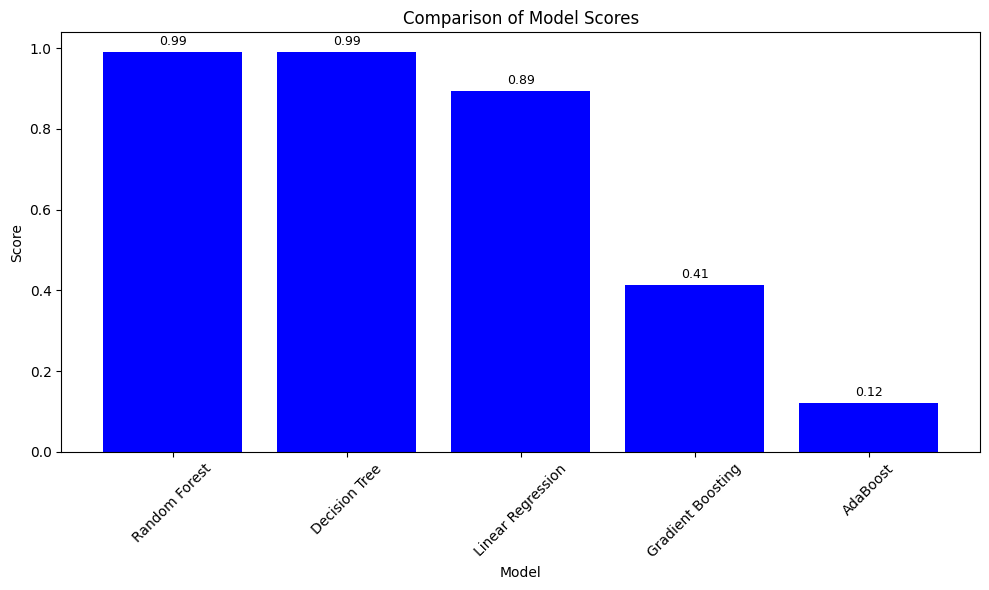

In [ ]:
# Create DataFrame
models_cross = pd.DataFrame({
    'Model': ['Gradient Boosting', 'AdaBoost', 'Random Forest', 'Decision Tree', 'Linear Regression'],
    'Score': [gradient, adab, random, decc, linear]
})

# Sort DataFrame by 'Score' in descending order
models_cross_sorted = models_cross.sort_values(by='Score', ascending=False)

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(models_cross_sorted['Model'], models_cross_sorted['Score'], color='blue')

# Add values on the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 2), ha='center', va='bottom', fontsize=9)

# Add labels and title
plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Comparison of Model Scores')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Display plot
plt.tight_layout()
plt.show()



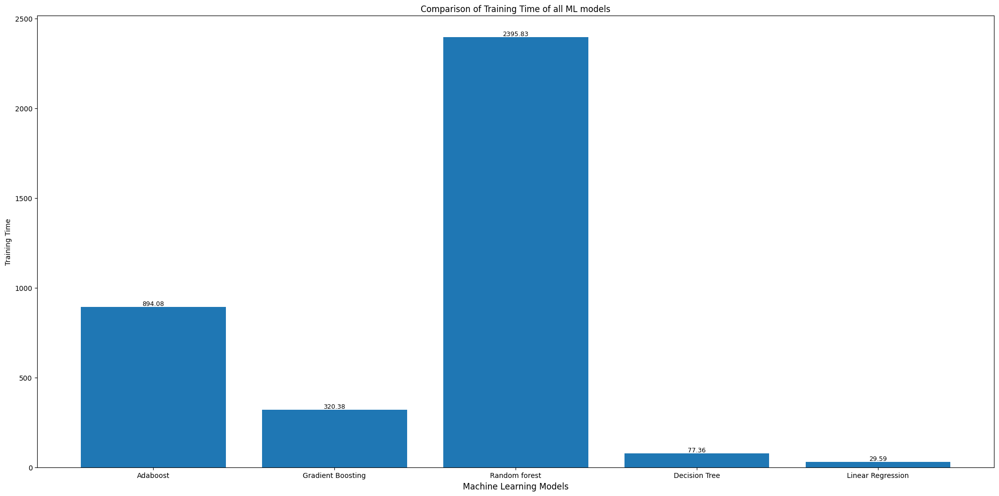

In [ ]:
# Model names and training times
model = ['Adaboost', 'Gradient Boosting', 'Random forest', 'Decision Tree', 'Linear Regression']
Train_Time = [
    train_time_ada,
    train_time_g,
    train_time_rand,
    train_time_dec,
    train_time_li
]

index = np.arange(len(model))

plt.figure(figsize=(20, 10))

# Create bar plot
bars = plt.bar(index, Train_Time)

# Add values on the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 2), ha='center', va='bottom', fontsize=9)

# Add labels and title
plt.xlabel('Machine Learning Models', fontsize=12)
plt.ylabel('Training Time', fontsize=10)
plt.xticks(index, model, fontsize=10)
plt.title('Comparison of Training Time of all ML models')

# Display plot
plt.tight_layout()
plt.show()


In [ ]:
import pickle
with open('home_prices_model.pickle','wb') as f:
    pickle.dump(rand_regr,f)

In [ ]:
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))

In [ ]:
def predict_price1(bath, bed, house_size, zip_code):
    # Load the model from the pickle file
    with open('home_prices_model.pickle', 'rb') as file:
        rand_regr = pickle.load(file)

    # Assuming X is defined elsewhere in your code
    loc_index = np.where(X.columns == str(zip_code))[0]

    if len(loc_index) > 0:
        loc_index = loc_index[0]
    else:
        # Handle case where zip_code is not found
        print("Zip code not found in data.")
        return None

    x = np.zeros(len(X.columns))
    x[0] = house_size
    x[1] = bath
    x[2] = bed
    if loc_index >= 0:
        x[loc_index] = 1

    return rand_regr.predict([x])[0]


In [ ]:
predict_price1(1,2, 800, 10004.0)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



861000.0

In [ ]:
X.to_csv('Col.csv', index=False)

In [ ]:
import pickle
with open("home_prices_model.pkl", 'wb') as file:
    pickle.dump(rand_regr, file)
